# 確率ロボティクス課題
千葉工業大学　先進工学部　未来ロボティクス学科

16C1077 高橋直樹

## Agentの定義

In [1]:
class Agent:
    def __init__(self):
        #self.actions = ["up","down","left","right"]
        self.actions = ["↑","↓","←","→"]
        self.pos = (0,0)
        
agent = Agent()

## 環境の定義

In [2]:
size = 35

class State:
    def __init__(self,actions):
        self.Q = {}
        for a in actions:
            self.Q[a] = 0.0
            
        self.reward = 1
        self.best_action = "↓"
        self.goal = False
        
    def set_goal(self,actions):
        for a in actions:
            self.Q[a] =0.0
            
        self.goal = True
        
states = [[State(agent.actions) for i in range(size)] for j in range(size)]
goal_pos = 26
states[goal_pos][goal_pos].set_goal(agent.actions)

## 報酬が低くなるところを追加

In [3]:
obs_box_pos = 10
obs_box_size = 10

def set_obstacle(pos, size):   
    for x in range(pos, pos + size):
        for y in range(pos, pos + size):
            states[x][y].reward += -3
            
set_obstacle(obs_box_pos, obs_box_size)

## 描画

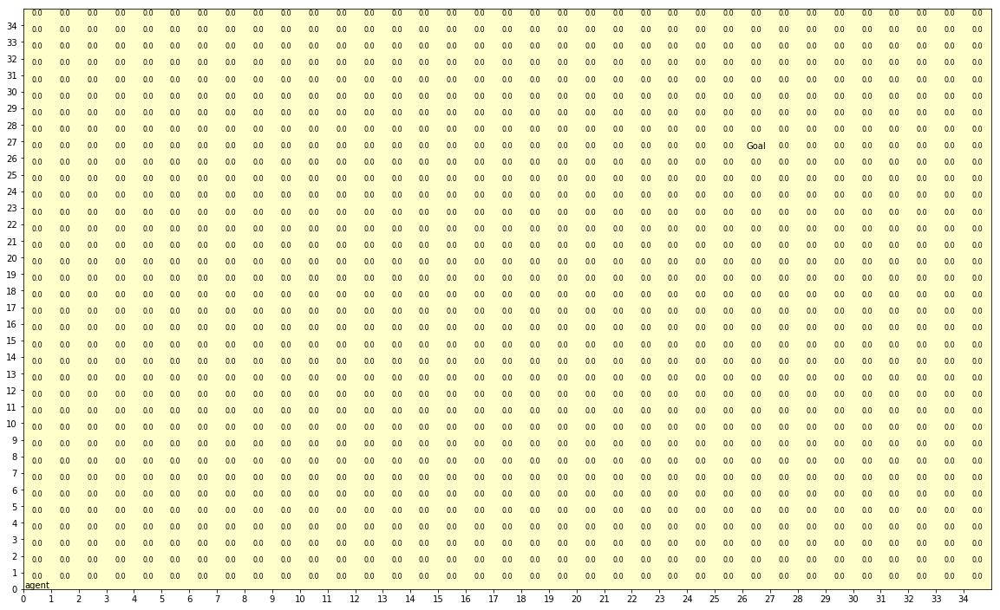

In [5]:
import matplotlib.pyplot as plt  
import matplotlib.patches as patches

def draw(mark_pos):
    fig, ax = plt.subplots(figsize=(20,20))
    values = [[states[i][j].Q[states[i][j].best_action] for i in range(size)] for j in range(size)]
    mp = ax.pcolor(values, cmap=plt.cm.YlOrRd,vmin=0,vmax=8)
    ax.set_aspect(0.6)
    ax.set_xticks(range(size), minor=False)
    ax.set_yticks(range(size), minor=False)
    
    for x in range(len(values)):
        for y in range(len(values[0])):
            s = states[x][y]
            if states[x][y].goal:
                plt.text(x+0.5, y+0.75, "Goal",ha='center', va='center', size=10)
            else:
                plt.text(x+0.5, y+0.75, int(100*s.Q[s.best_action])/100, ha='center', va='center', size=8)
                
    plt.text(agent.pos[0]+0.5, agent.pos[1]+0.25, "agent", ha='center', va='center', size=10)
    
    if mark_pos == "all":   # 指定した位置にactionの文字列を書くという処理
        for x in range(size):
            for y in range(size):
                if states[x][y].goal: continue
                plt.text(x+0.5, y+0.25, states[x][y].best_action,ha='center', va='center', size=10)
                
    elif mark_pos != None: 
        s = states[mark_pos[0]][mark_pos[1]]
        plt.text(mark_pos[0]+0.5, mark_pos[1]+0.25, s.best_action,ha='center', va='center', size=10)
            
    plt.show()
    fig.clear()
    
draw(None)

## 状態遷移の実装

In [6]:
import random

def state_transition(s_pos,a):
    ###確率10%で元のまま ###
    if random.uniform(0,1) < 0.1:
        return s_pos
    
    x,y = s_pos
    if   a == "↑": y += 1
    elif a == "↓": y += -1
    elif a == "→": x += 1
    elif a == "←": x += -1
        
    if x < 0:       x = 0
    elif x >= size: x = size-1
    if y < 0:       y = 0
    elif y >= size: y = size-1
        
    return (x,y)

### 方策（$\epsilon$-greedy)

In [7]:
def e_greedy(s):
    if random.uniform(0,1) < 0.1: #10%でランダムに
        return random.choice(agent.actions)
    
    else:
        best_a = None
        best_q = 1000000000
        
        for a in s.Q:
            if best_q > s.Q[a]:
                best_q = s.Q[a]
                best_a = a
        s.best_action = best_a
        
        return best_a

## 1ステップの処理
1000000回のトライでゴールに到達したエージェントのみプロットする

In [8]:
alpha = 0.6
gamma = 0.9

def sarsa(s_pos,a):
    s = states[s_pos[0]][s_pos[1]]
    s_next_pos = state_transition(s_pos,a)
    s_next = states[s_next_pos[0]][s_next_pos[1]]
    a_next = e_greedy(s_next)
    
    q = (1.0-alpha)*s.Q[a] + alpha * (s_next.reward + gamma * s_next.Q[a_next])
    #print("s:" + str(s_pos)+ "　a:" + a + " s':" + str(s_next_pos) + " a':" + a_next)
    #print("----")
    return s_next_pos, a_next, q

def one_trial():
    agent.pos = (random.randrange(size),random.randrange(size))
    a = e_greedy(states[agent.pos[0]][agent.pos[1]])
    
    if states[agent.pos[0]][agent.pos[1]].goal:
        return
          
    for i in range(1000000):
        #draw(None)
        s_next, a_next, q = sarsa(agent.pos,a)
        states[agent.pos[0]][agent.pos[1]].Q[a] = q
        agent.pos = s_next
        a = a_next
        
        if states[agent.pos[0]][agent.pos[1]].goal:
            draw("all")
            break

one_trialの回数を決める

  1%|          | 1/128 [00:02<06:08,  2.90s/it]

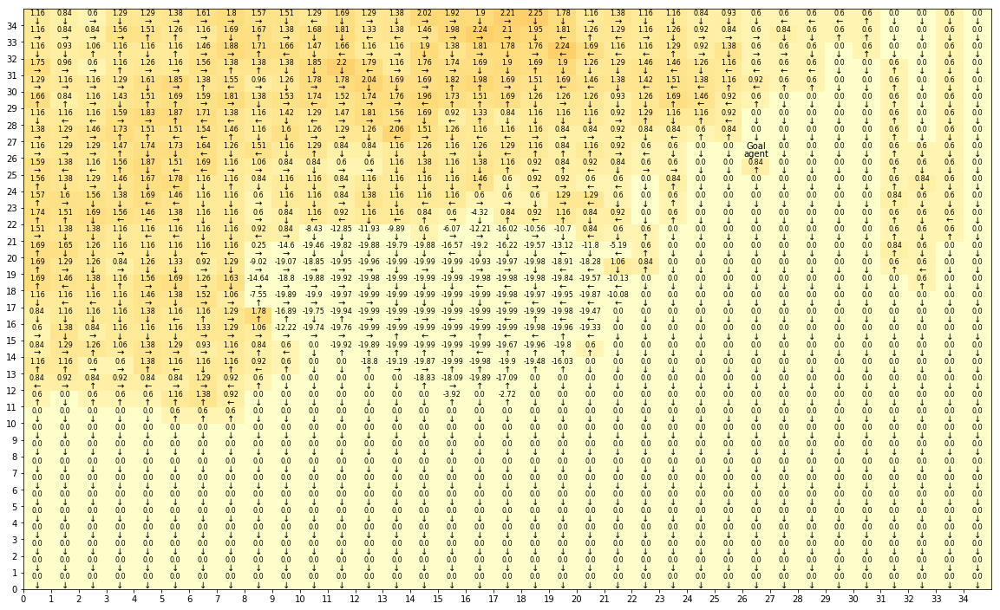

  2%|▏         | 2/128 [00:07<06:57,  3.31s/it]

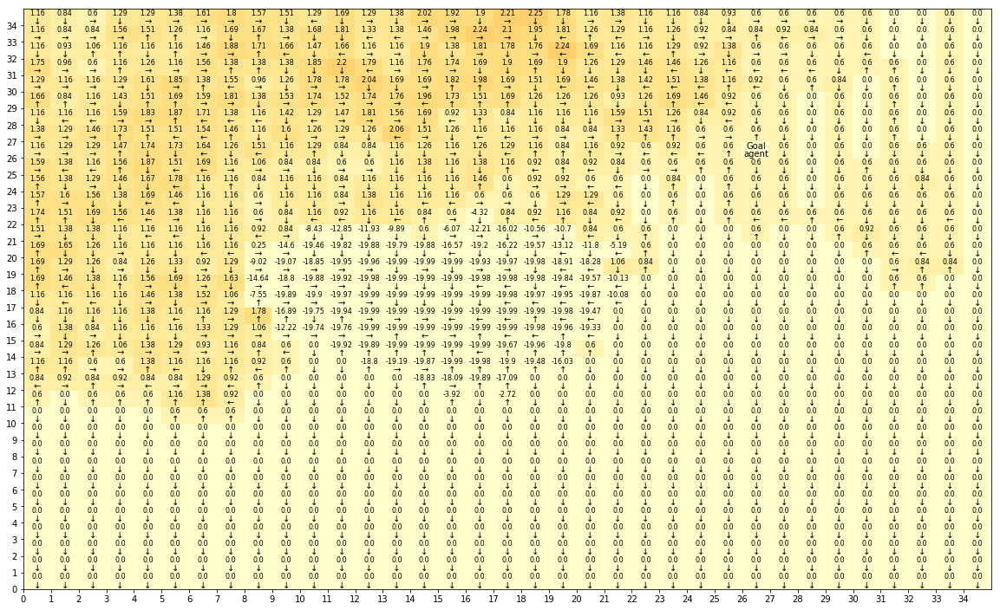

 13%|█▎        | 17/128 [00:52<05:23,  2.91s/it]

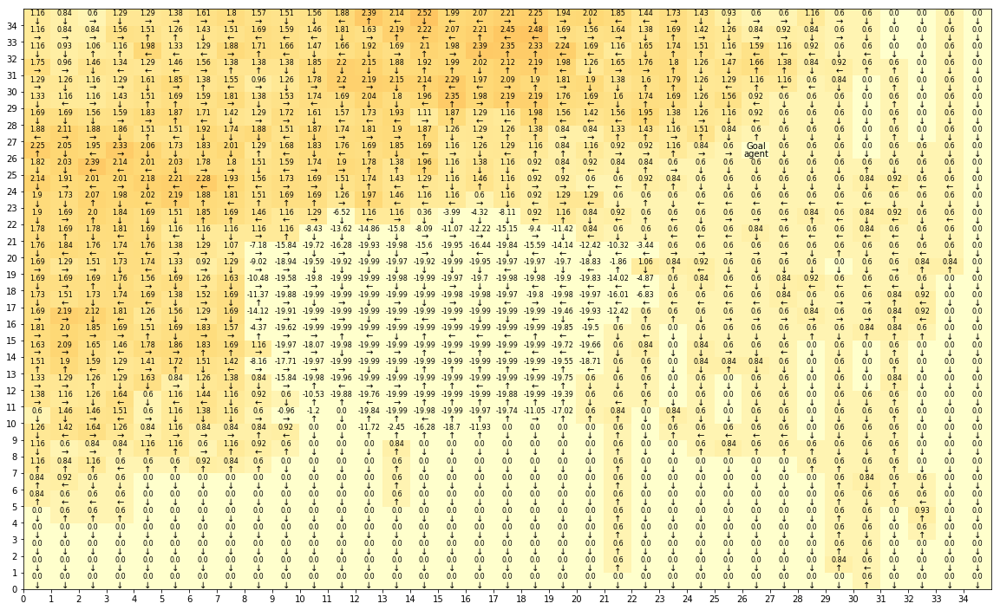

 17%|█▋        | 22/128 [01:08<05:22,  3.04s/it]

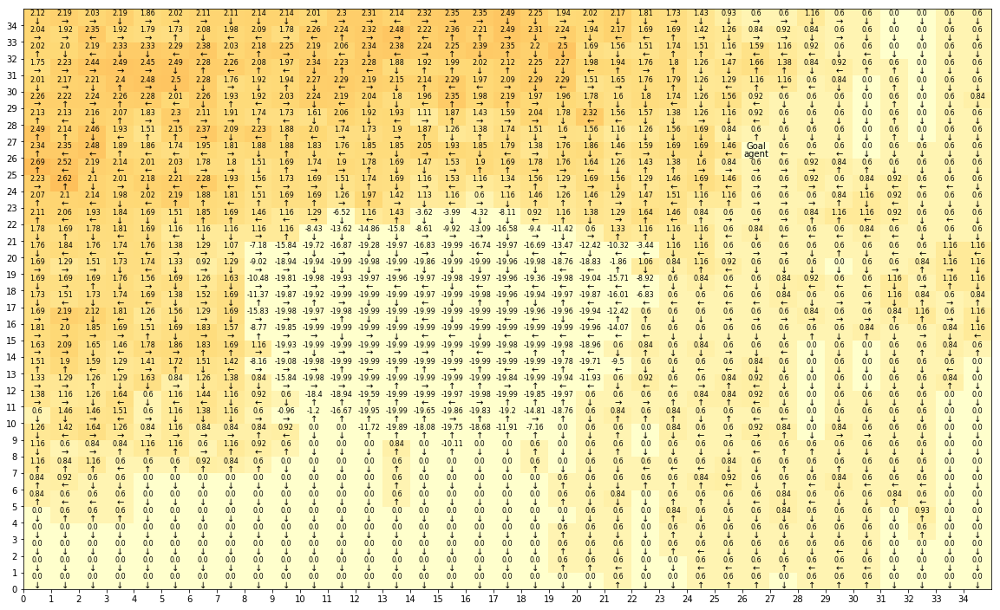

 22%|██▏       | 28/128 [01:27<05:05,  3.05s/it]

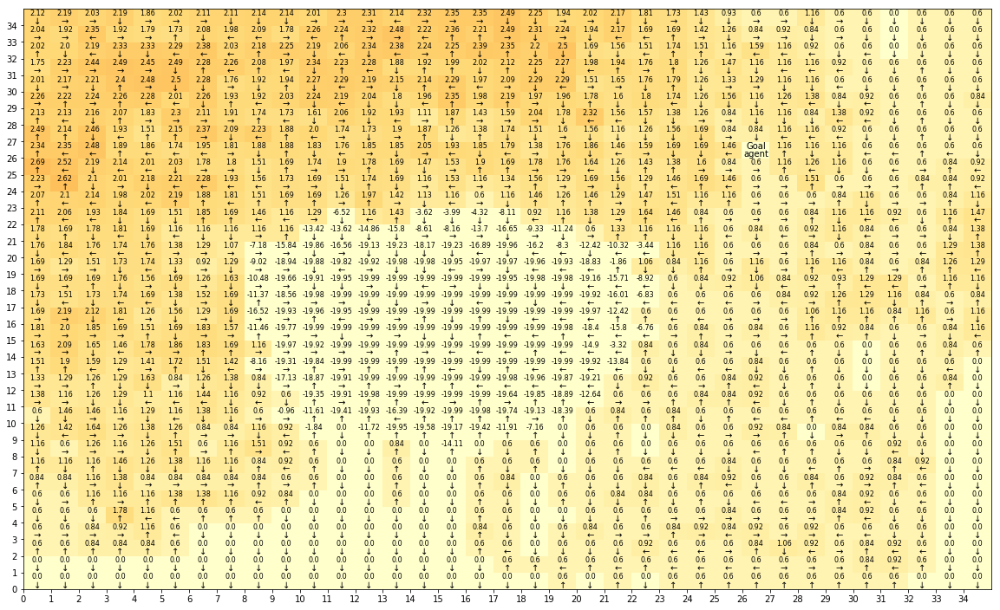

 23%|██▎       | 29/128 [01:32<05:43,  3.47s/it]

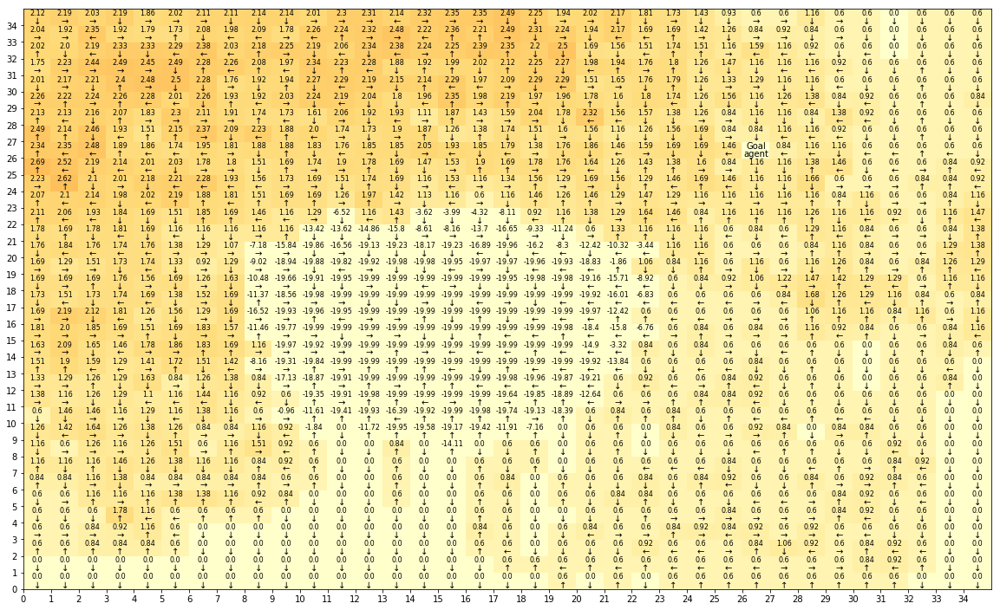

 23%|██▎       | 30/128 [01:36<06:09,  3.77s/it]

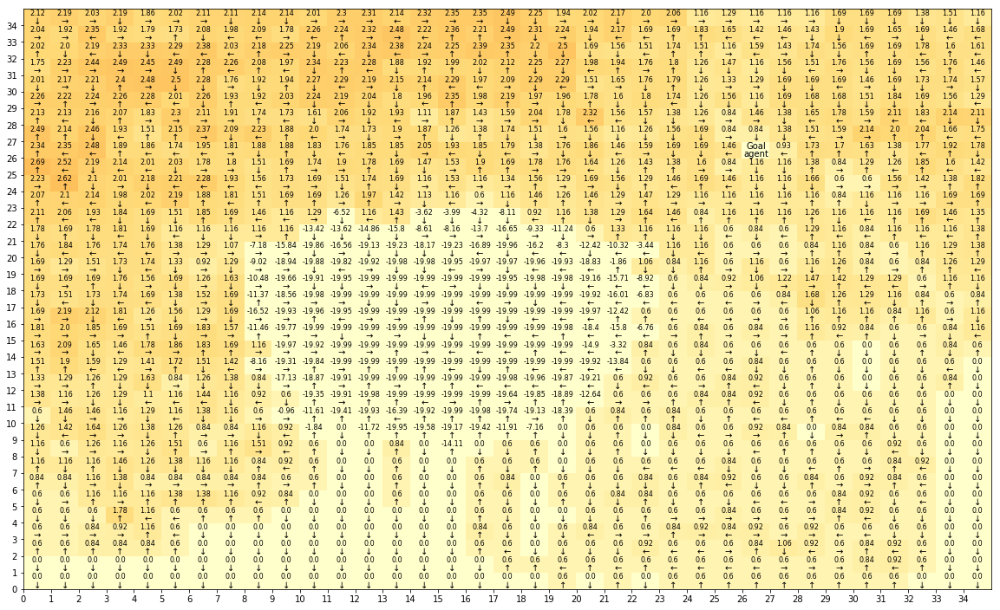

 30%|██▉       | 38/128 [02:01<04:33,  3.04s/it]

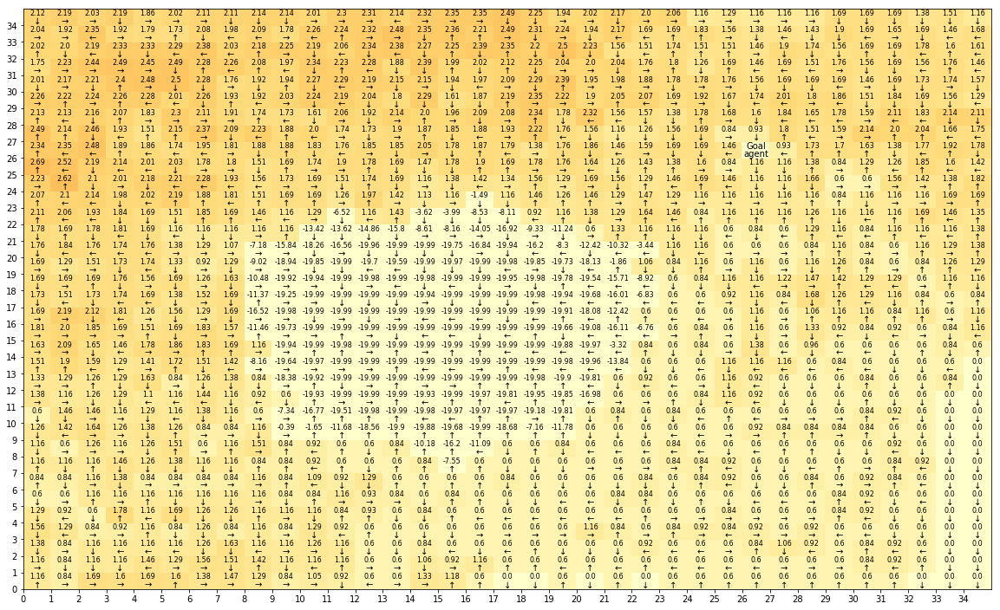

 33%|███▎      | 42/128 [02:15<04:46,  3.33s/it]

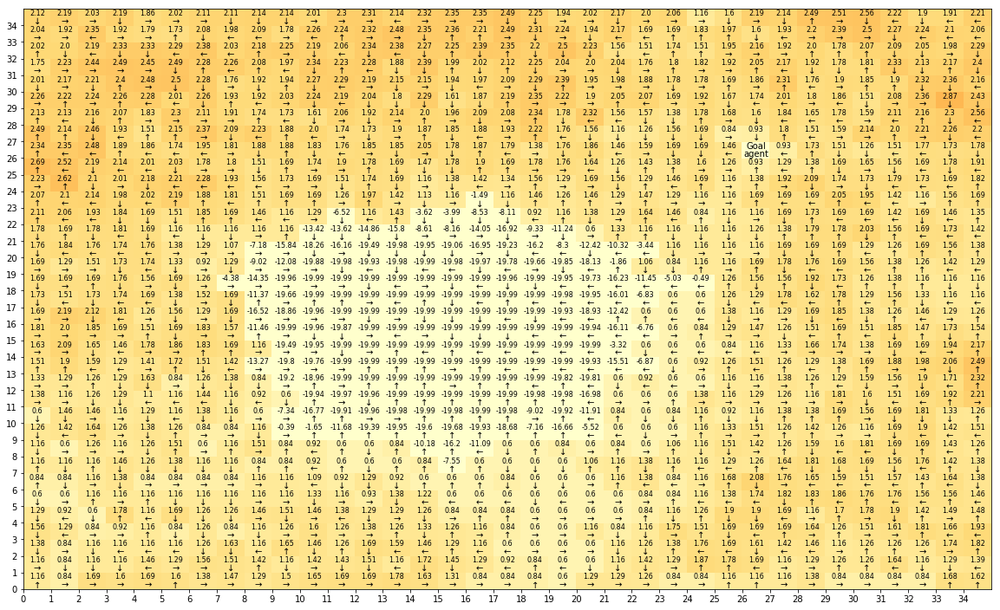

 38%|███▊      | 49/128 [02:37<03:57,  3.00s/it]

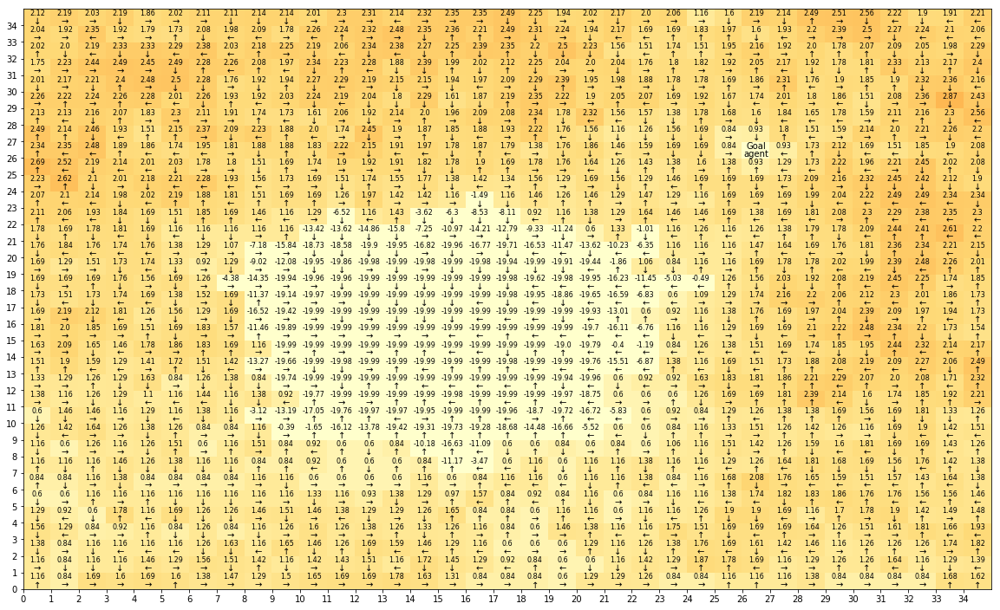

 49%|████▉     | 63/128 [03:18<02:44,  2.54s/it]

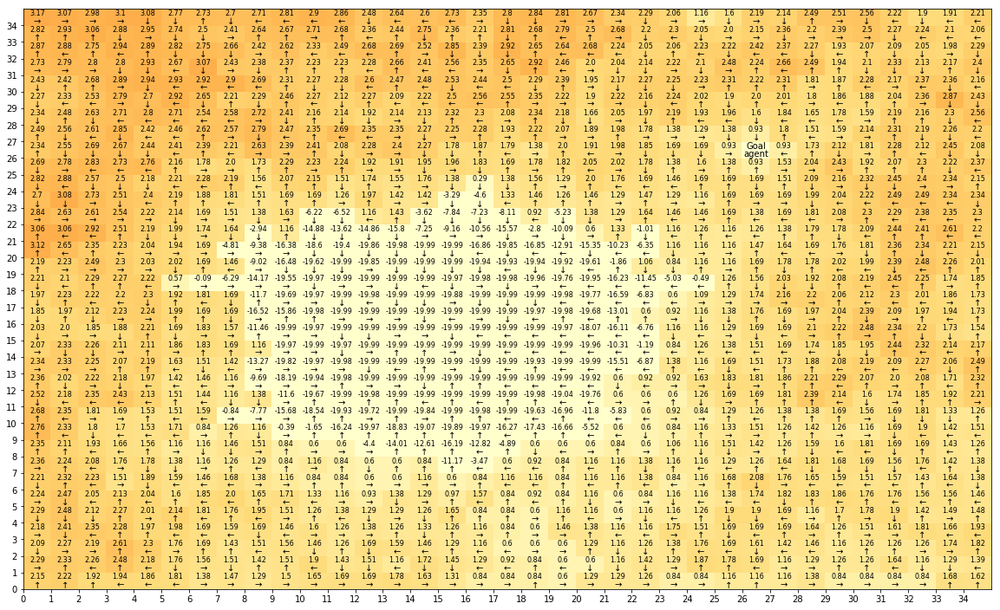

 53%|█████▎    | 68/128 [03:34<02:58,  2.98s/it]

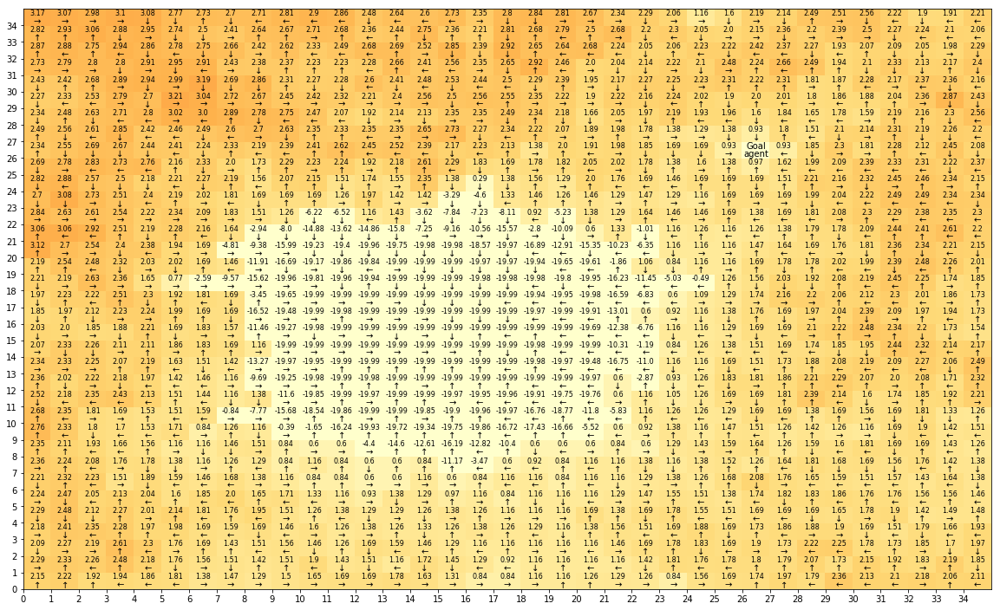

 55%|█████▌    | 71/128 [03:45<03:01,  3.18s/it]

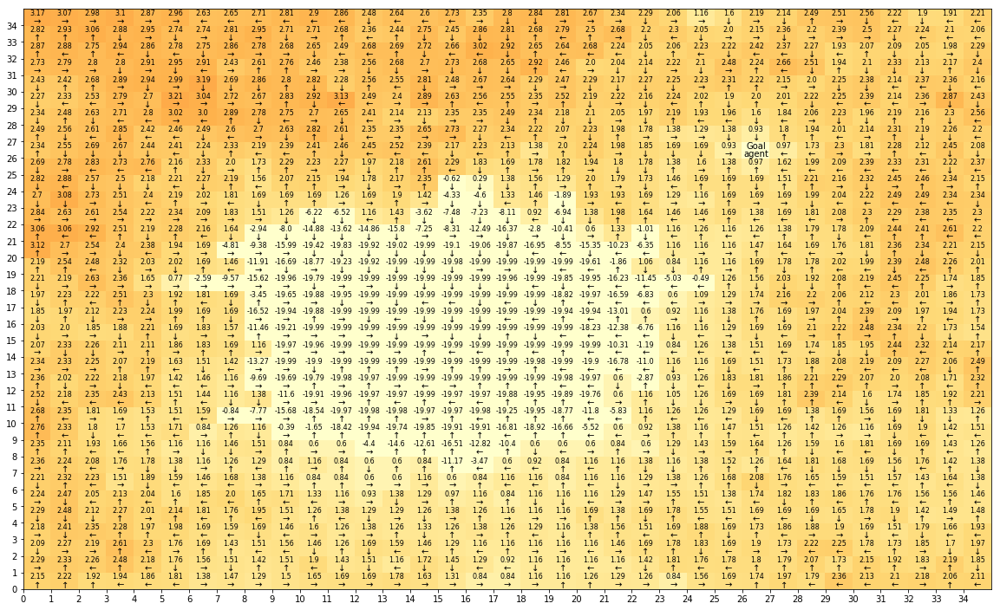

 56%|█████▋    | 72/128 [03:49<03:18,  3.55s/it]

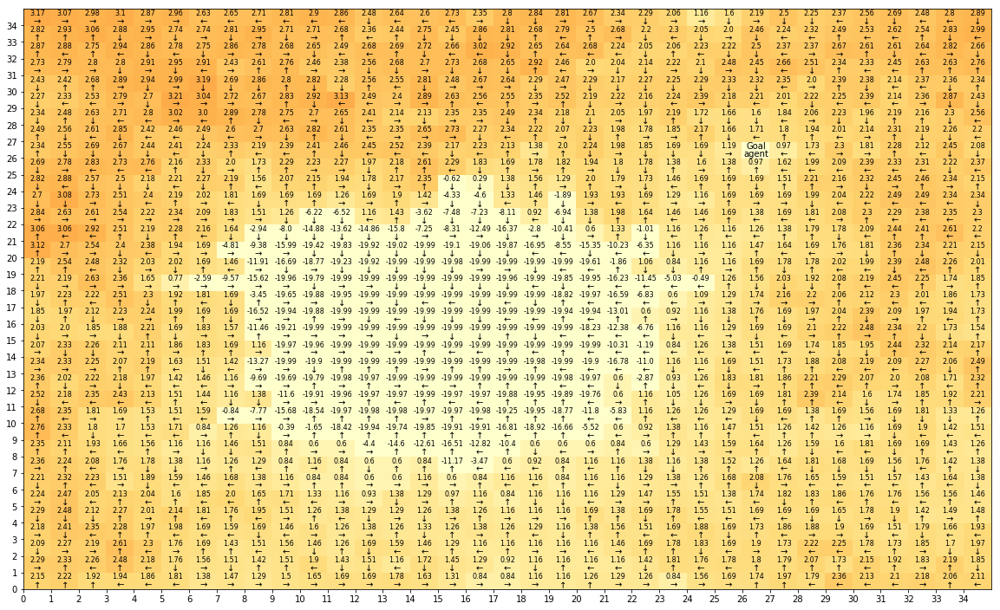

 58%|█████▊    | 74/128 [03:56<03:12,  3.56s/it]

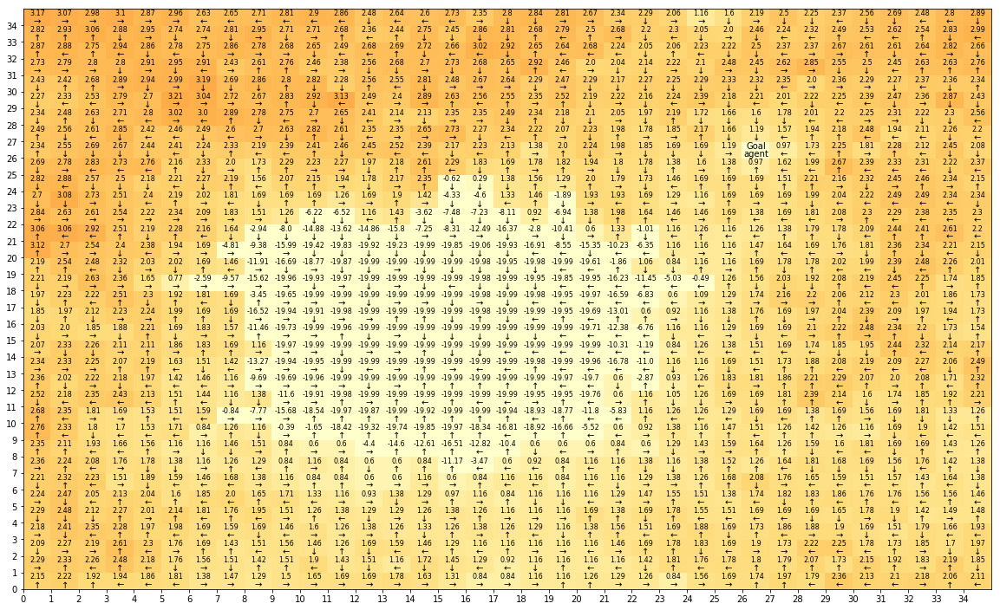

 62%|██████▏   | 79/128 [04:13<02:36,  3.18s/it]

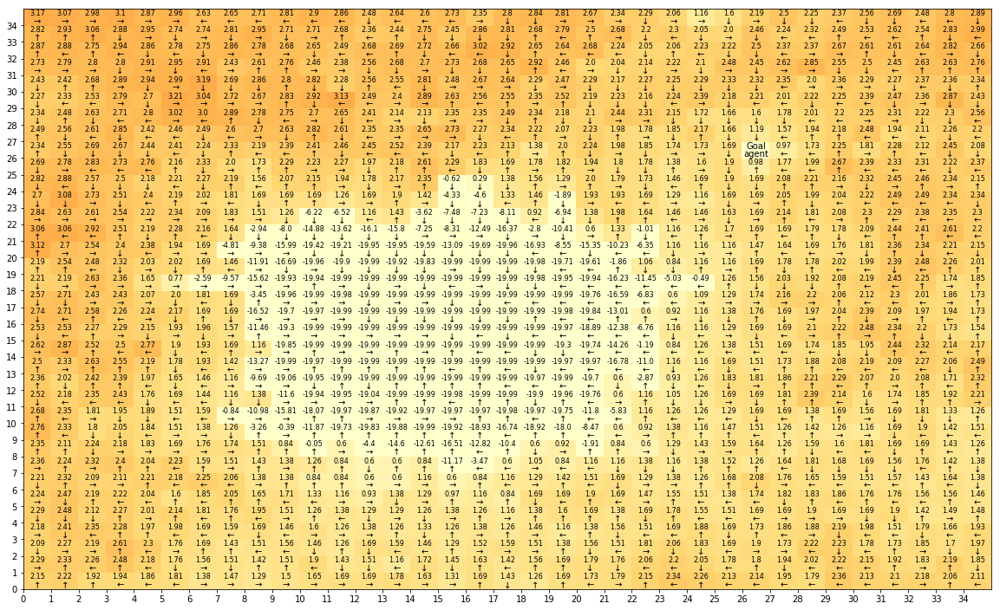

 62%|██████▎   | 80/128 [04:17<02:50,  3.55s/it]

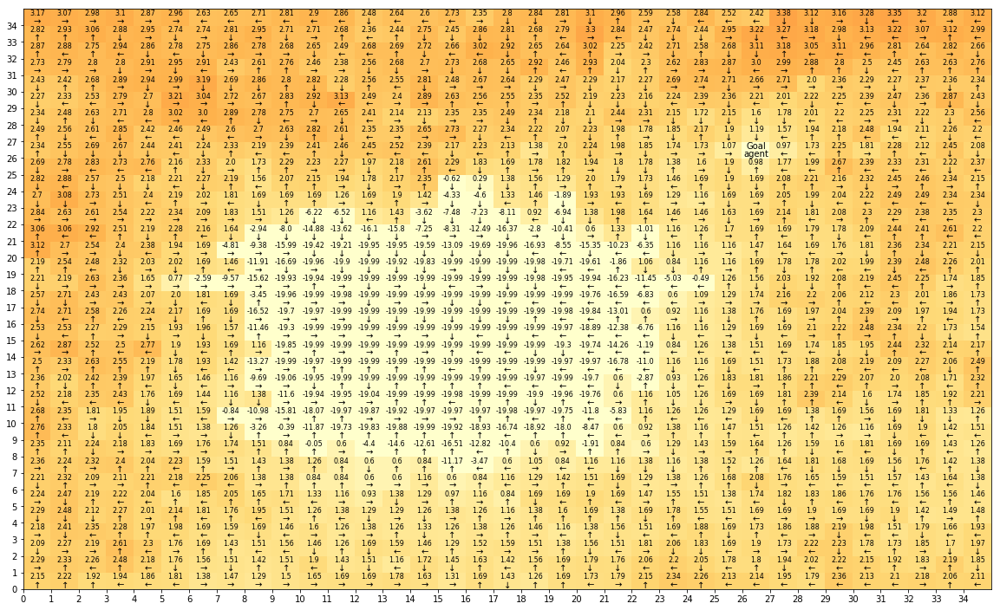

 67%|██████▋   | 86/128 [04:36<02:09,  3.09s/it]

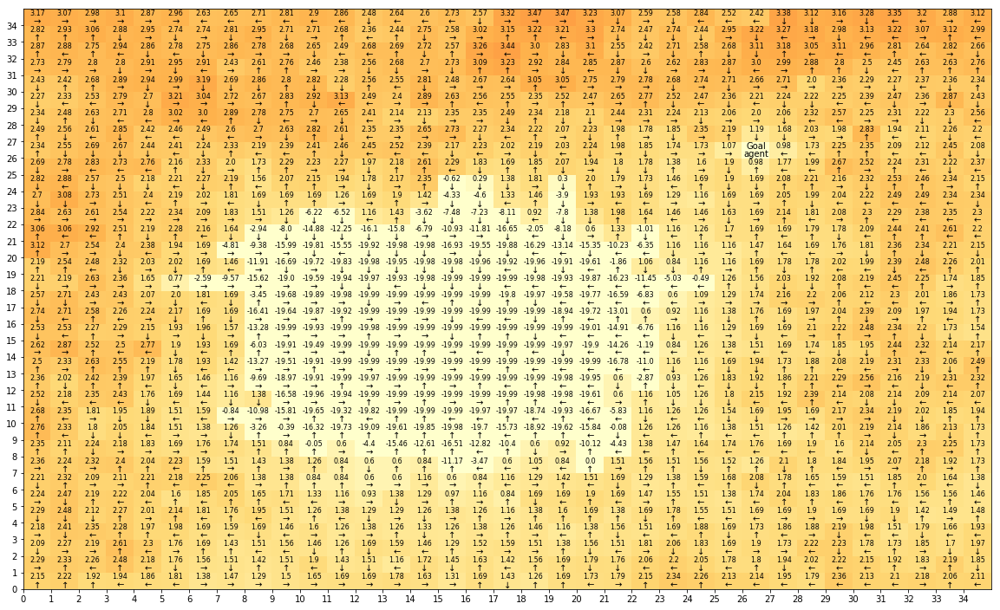

 69%|██████▉   | 88/128 [04:44<02:13,  3.34s/it]

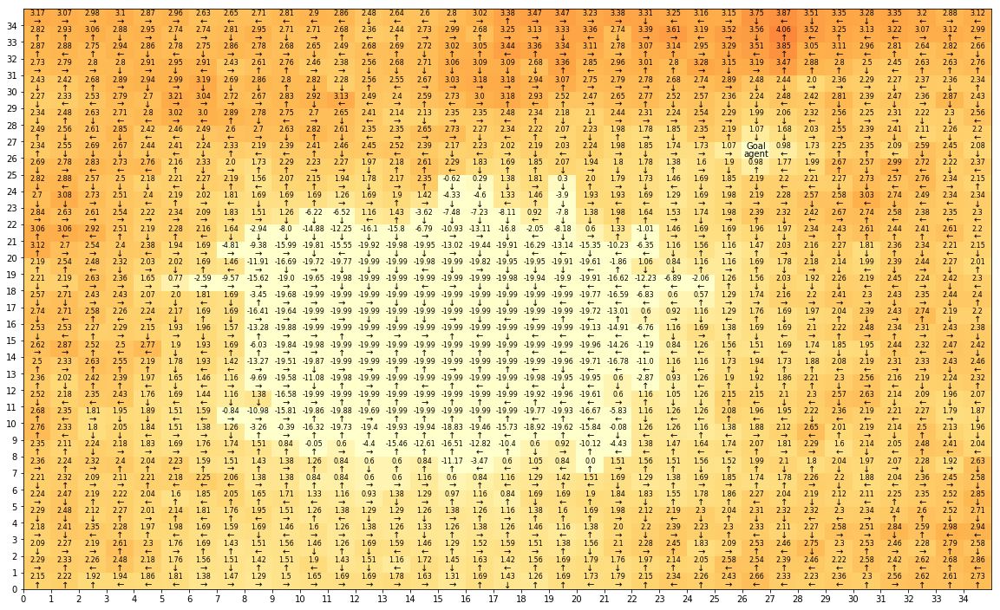

 73%|███████▎  | 93/128 [05:00<01:49,  3.12s/it]

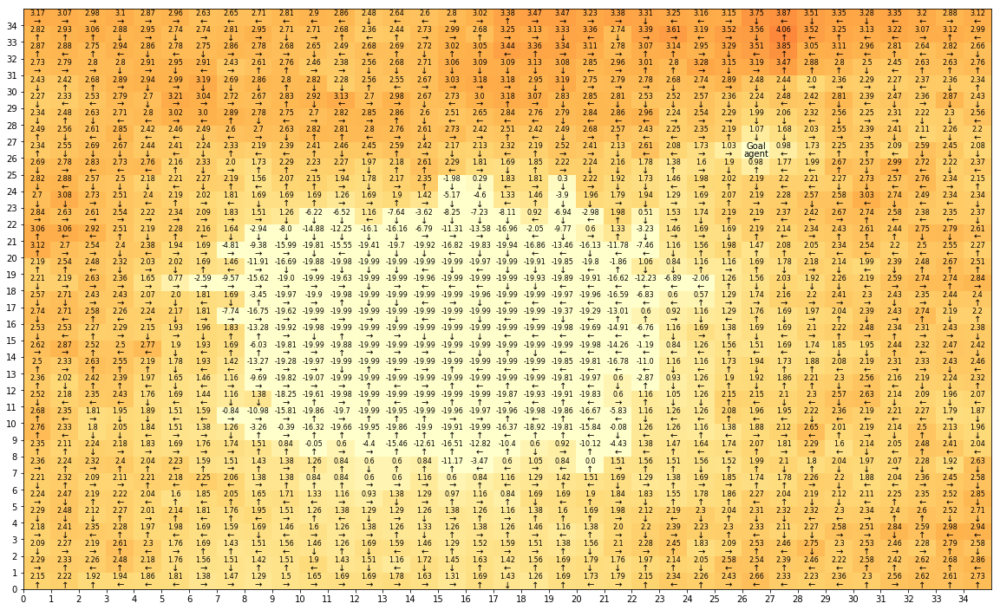

 79%|███████▉  | 101/128 [05:26<01:22,  3.06s/it]

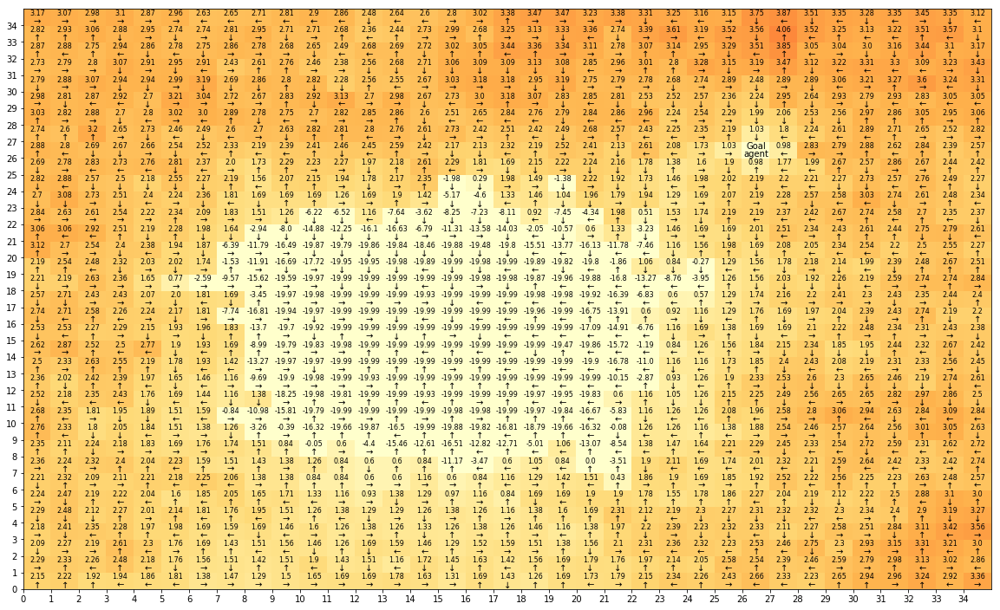

 86%|████████▌ | 110/128 [05:55<00:54,  3.01s/it]

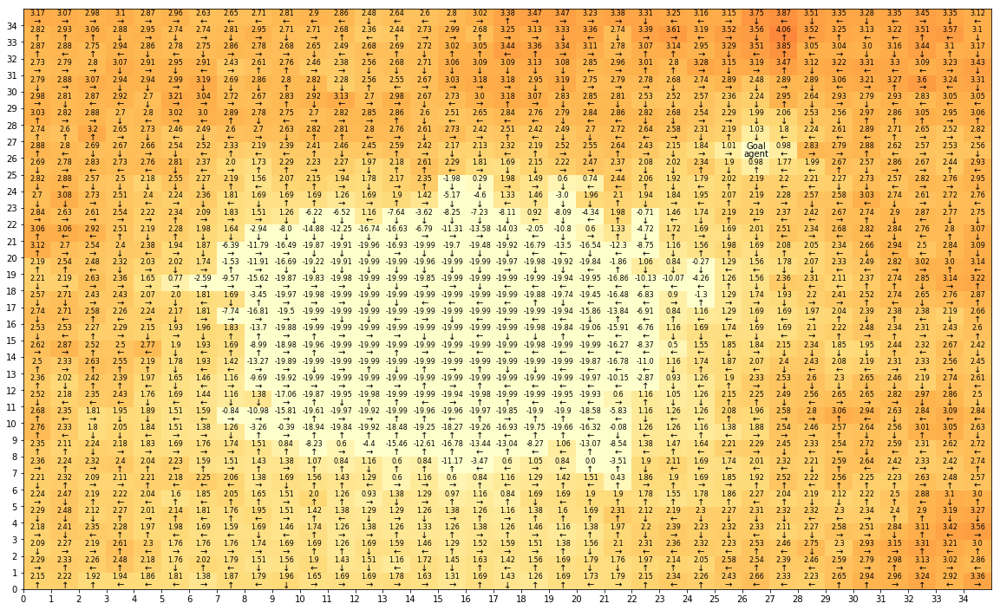

 90%|████████▉ | 115/128 [06:11<00:39,  3.05s/it]

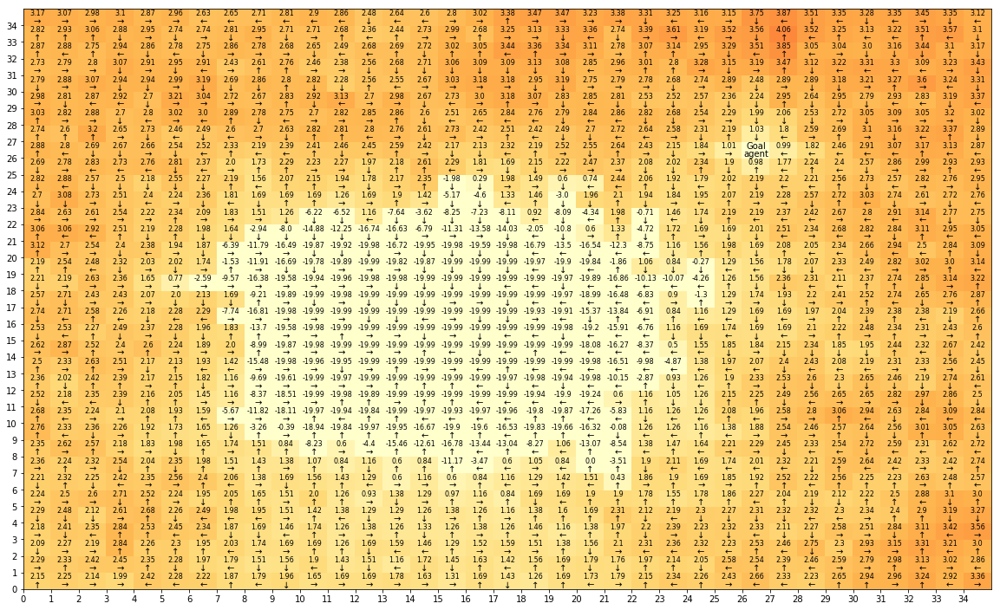

 92%|█████████▏| 118/128 [06:21<00:32,  3.21s/it]

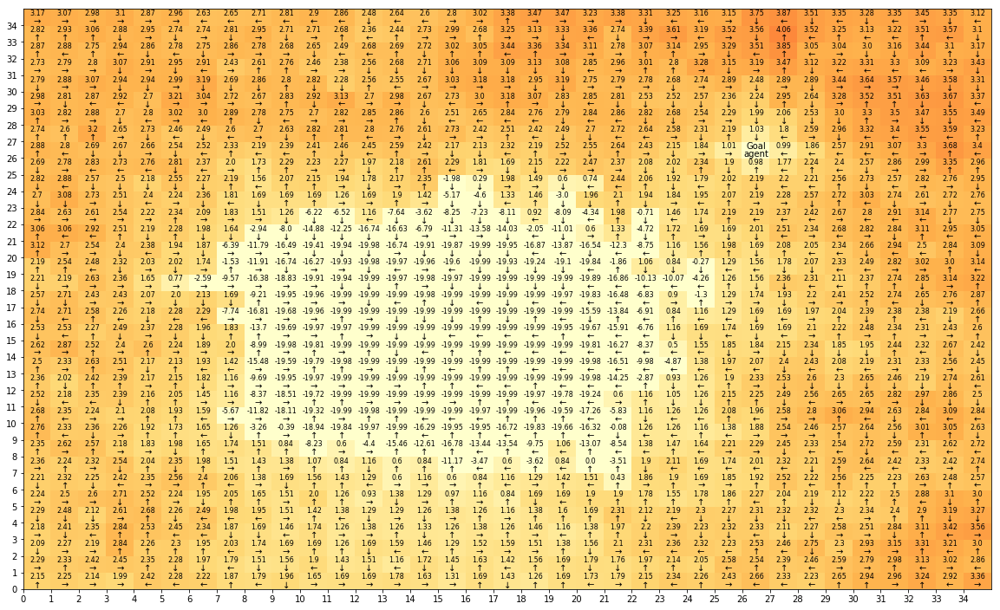

100%|██████████| 128/128 [06:52<00:00,  3.22s/it]


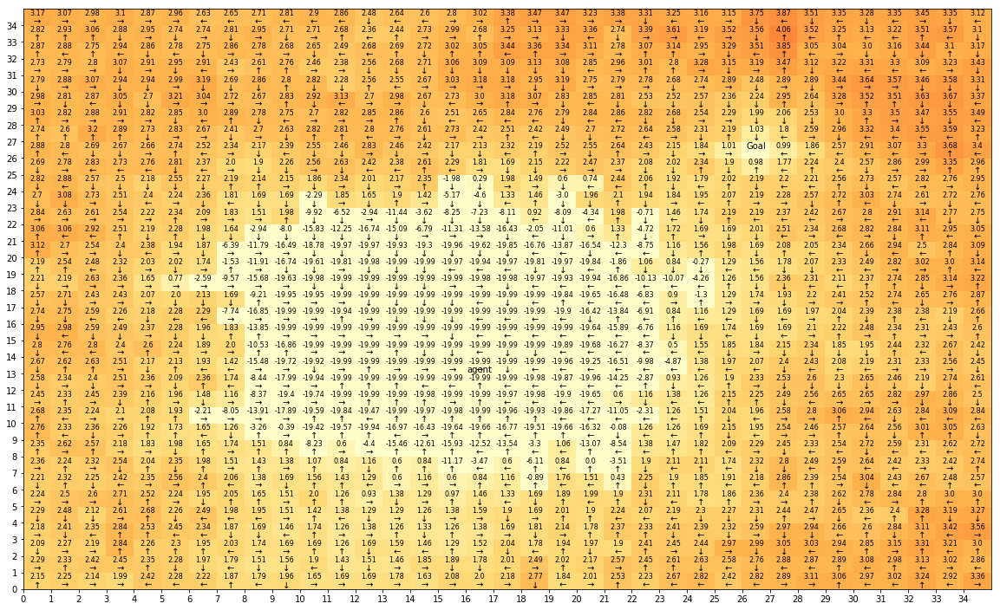

In [9]:
#from tqdm._tqdm_notebook import tqdm_notebook
from tqdm import tqdm

max_step = 128

for i in tqdm(range(max_step)):
    one_trial()
    
draw("all")